<a href="https://colab.research.google.com/github/DanielYzuel/Plant_Seedings_Classification/blob/main/00_Preprocesado_de_Datos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 07MIAR_Proyecto_Programación - 01 Preparacion del dataset

## 0. Librerías y funciones auxiliares

In [ ]:
from google.colab import drive
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from skimage.color import rgb2hsv
import json
import pandas as pd
from PIL import Image
import os
from tqdm import tqdm
from tqdm import tqdm
import os
from PIL import Image
import threading
from concurrent.futures import ThreadPoolExecutor, as_completed

def view(img):
    plt.imshow(img, cmap = 'gray')
    plt.axis('off')
    plt.show()

labels=["Loose Silky-bent",
        "Common Chickweed",
        "Scentless Mayweed",
        "Small-flowered Cranesbill",
        "Fat Hen",
        "Charlock",
        "Sugar beet",
        "Cleavers",
        "Black-grass",
        "Shepherds Purse",
        "Common wheat",
        "Maize"]

## 1. Creacion del dataset

### 1.1. Conexión remota con Google Drive

In [ ]:
# Conectamos con nuestro Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


### 1.2. Establecer ruta directa al directorio y lectura de datos

In [ ]:
# Establezco una ruta absoluta a un directorio existente de mi Google Drive
BASE_FOLDER = "/content/drive/MyDrive/BASE_FOLDER/"

### 1.3. Estandarizacion del dataset a un JSON

In [ ]:
ruta_directorio = BASE_FOLDER + "my_dataset/train"

diccionario_imagenes = {}


for nombre_clase in os.listdir(ruta_directorio):
    ruta_carpeta_clase = os.path.join(ruta_directorio, nombre_clase)

    if os.path.isdir(ruta_carpeta_clase):
        for nombre_imagen in os.listdir(ruta_carpeta_clase):
            ruta_imagen = os.path.join(ruta_carpeta_clase, nombre_imagen)
            diccionario_imagenes[ruta_imagen] = nombre_clase


with open(BASE_FOLDER+ "my_dataset/etiquetas.json", "w") as f:
    json.dump(diccionario_imagenes, f)

## 2. Exploracion del dataset

### 2.1 cargado del dataset

In [ ]:
with open("/content/drive/MyDrive/BASE_FOLDER/my_dataset/etiquetas.json", 'r') as file:
    data = json.load(file)
df = pd.DataFrame(list(data.items()), columns=['Img', 'Label'])

# Contar el número de claves (filas) para cada valor único de 'Label'
conteo_etiquetas = df['Label'].value_counts().reset_index()
conteo_etiquetas.columns = ['Label', 'Count']

df

,Img,Label
0,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Black-grass
1,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Black-grass
2,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Black-grass
3,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Black-grass
4,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Black-grass
...,...,...
4745,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Sugar beet
4746,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Sugar beet
4747,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Sugar beet
4748,/content/drive/MyDrive/BASE_FOLDER/my_dataset/...,Sugar beet


### 2.2 Conteo de las clases de dataset

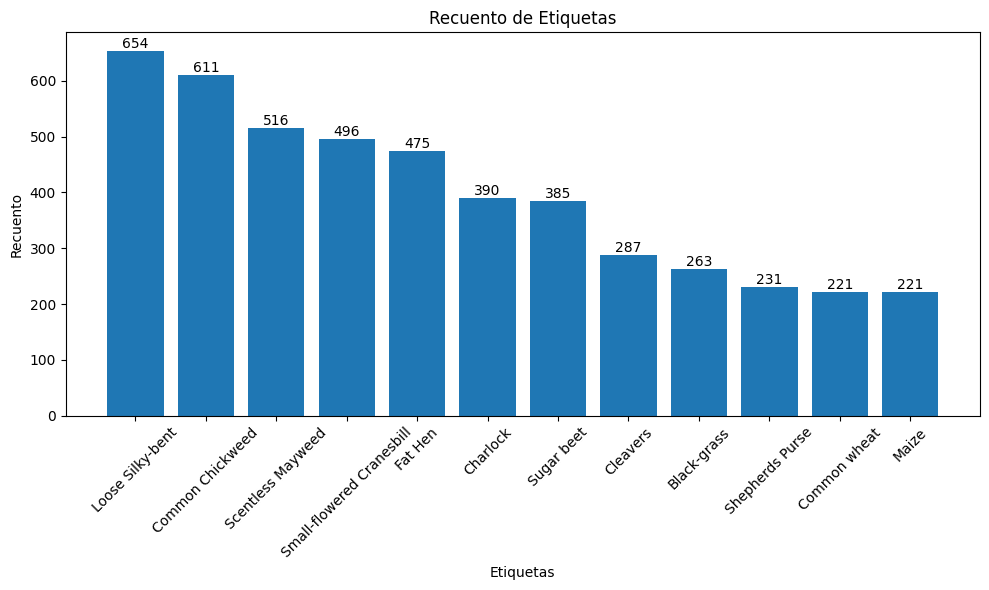

,Label,Count
0,Loose Silky-bent,654
1,Common Chickweed,611
2,Scentless Mayweed,516
3,Small-flowered Cranesbill,496
4,Fat Hen,475
5,Charlock,390
6,Sugar beet,385
7,Cleavers,287
8,Black-grass,263
9,Shepherds Purse,231


In [ ]:
# Contar el número de claves (filas) para cada valor único de 'Label'
conteo_etiquetas = df['Label'].value_counts().reset_index()
conteo_etiquetas.columns = ['Label', 'Count']

plt.figure(figsize=(10, 6))
bars = plt.bar(conteo_etiquetas['Label'], conteo_etiquetas['Count'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

plt.xlabel('Etiquetas')
plt.ylabel('Recuento')
plt.title('Recuento de Etiquetas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

conteo_etiquetas

### 2.3 visualizar imagenes

In [ ]:
def obtener_n_esima_imagen_por_etiqueta(etiqueta, n, dataframe):
    # Filtrar el DataFrame por la etiqueta dada
    df_filtrado = dataframe[dataframe['Label'] == etiqueta]

    # Restablecer el índice para poder acceder por índice numérico
    df_filtrado = df_filtrado.reset_index(drop=True)

    # Verificar si 'n' está dentro del rango del número de imágenes para esa etiqueta
    return df_filtrado.iloc[n]['Img']

def discover_dataset(df,num_cols):

    num_rows = len(labels)

    # Crear el subplot
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(30, 30))

    # Iterar sobre las etiquetas y mostrar las imágenes en el subplot
    for i, l in enumerate(labels):
        for j in range(num_cols):
            image = Image.open(obtener_n_esima_imagen_por_etiqueta(l, j+1, df))  # Se añade 1 para obtener la enésima y la (enésima+1) imagen
            axs[i, j].imshow(image)
            axs[i, j].set_title(f"{l}, size:{image.size}")
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()



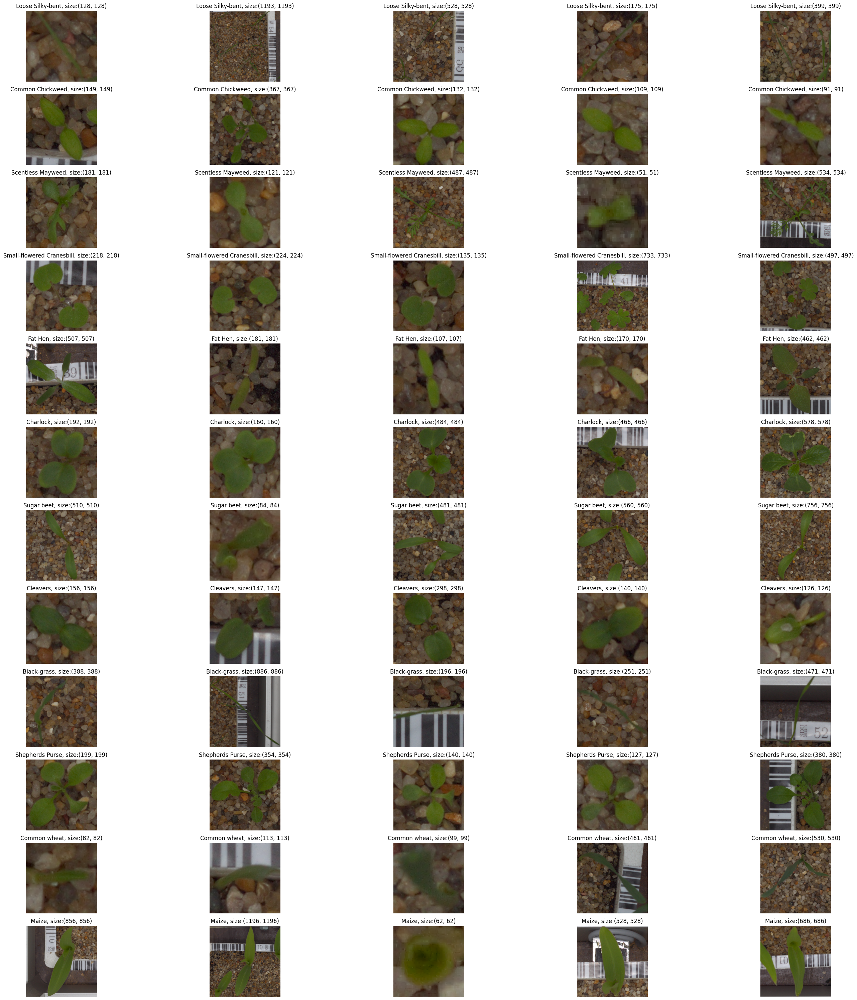

In [ ]:
discover_dataset(df,5)

## 3 Preparacion del dataset

### 3.1 Reescalado de las imagenes

In [ ]:
def resize_image(image, target_size):
    """reescala las imagenes"""
    width, height = image.size

    scale = max(target_size[0] / width, target_size[1] / height)

    new_width = int(width * scale)
    new_height = int(height * scale)

    resized_image = image.resize((new_width, new_height), Image.ANTIALIAS)

    padded_image = Image.new("RGB", target_size)
    padded_image.paste(resized_image, ((target_size[0] - new_width) // 2, (target_size[1] - new_height) // 2))

    return padded_image

In [ ]:
def resize_image_aspect_ratio(image, target_size):
    """reescala las imagenes respetando el ratio"""
    width, height = image.size

    aspect_ratio = width / height

    target_width, target_height = target_size
    target_aspect_ratio = target_width / target_height

    if aspect_ratio > target_aspect_ratio:
        new_width = target_width
        new_height = int(new_width / aspect_ratio)
        resized_image = image.resize((new_width, new_height), Image.ANTIALIAS)
        padding_height = (target_height - new_height) // 2
        padded_image = Image.new("RGB", target_size)
        padded_image.paste(resized_image, (0, padding_height))
    else:
        new_height = target_height
        new_width = int(new_height * aspect_ratio)
        resized_image = image.resize((new_width, new_height), Image.ANTIALIAS)
        padding_width = (target_width - new_width) // 2
        padded_image = Image.new("RGB", target_size)
        padded_image.paste(resized_image, (padding_width, 0))

    return padded_image

(175, 175)


<ipython-input-9-8dd5e7f21137>:20: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_image = image.resize((new_width, new_height), Image.ANTIALIAS)


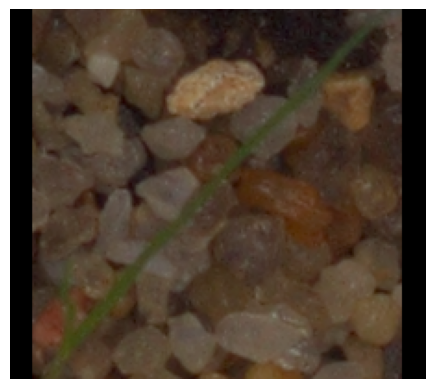

(225, 200)


In [ ]:
image = Image.open("/content/drive/MyDrive/BASE_FOLDER/my_dataset/train/Loose Silky-bent/0012f11c4.png")
print(image.size)
resized_image = resize_image_aspect_ratio(image, (225, 200))
view(resized_image)
print(resized_image.size)


### 3.2 Reescalar todo el dataset

In [ ]:
def resize_and_save_image(row,size,folder_name):
    path = row['Img']
    image = Image.open(path)
    resized_image = resize_image_aspect_ratio(image, size)
    new_path = path.replace('train', folder_name)
    os.makedirs(os.path.dirname(new_path), exist_ok=True)
    resized_image.save(new_path)

def resize_all_dataset(df, size, folder_name):
    # Crear una lista de hilos
    threads = []

    # Iterar sobre el DataFrame y crear un hilo para cada fila
    for index, row in df.iterrows():
        thread = threading.Thread(target=resize_and_save_image, args=(row,size, folder_name,))
        thread.start()
        threads.append(thread)

    # Esperar a que todos los hilos terminen
    for thread in threads:
        thread.join()

In [ ]:
resize_all_dataset(df, (224, 224),'train_224')

### 3.3 leyendo dataset reescalado

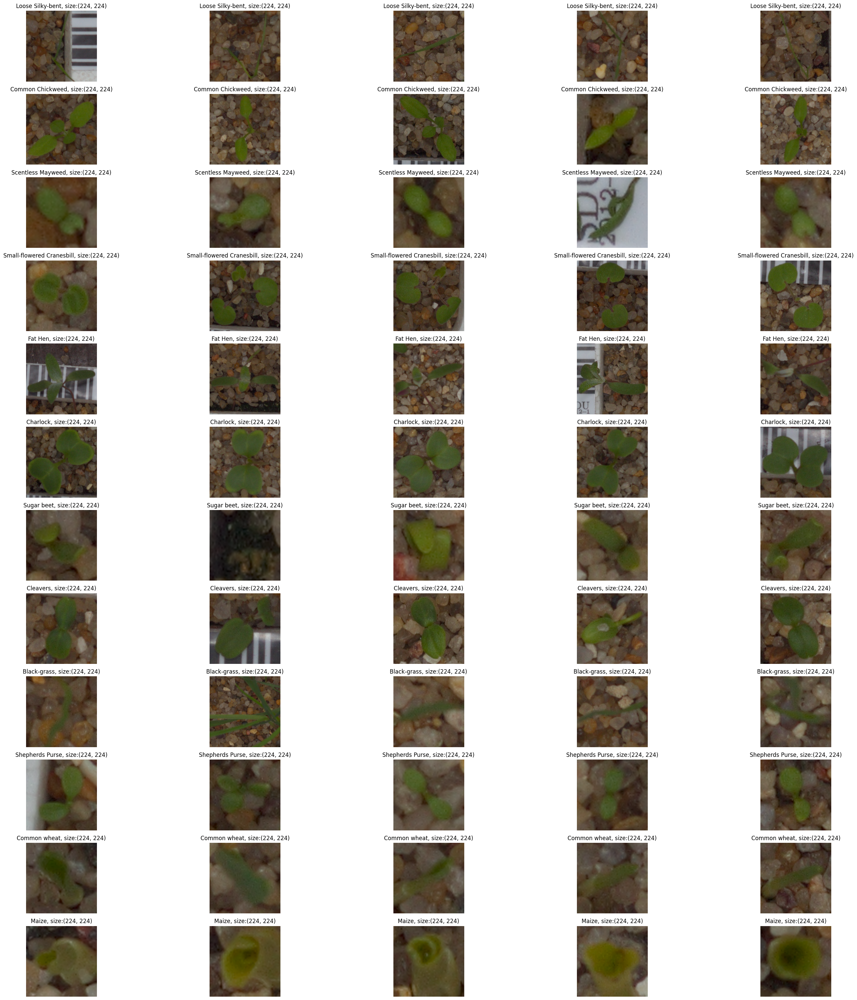

In [ ]:
with open("/content/drive/MyDrive/BASE_FOLDER/my_dataset/train_resize_224.json", 'r') as file:
    data = json.load(file)
df = pd.DataFrame(list(data.items()), columns=['Img', 'Label'])

discover_dataset(df,5)

## 4 Segmentado

### 4.1 Segmentado de imagen

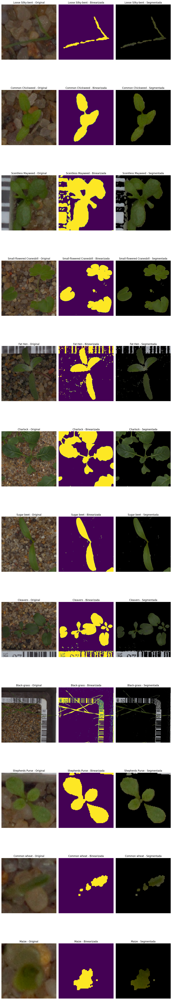

In [ ]:
def segmentator(image_path):
    original_image = cv2.imread(image_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)
    histograma = cv2.calcHist([cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY) ], [0], None, [256], [0,256])
    hsv_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2HSV)
    plt.imshow(hsv_image)
    hsv_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2HSV)
    histograma = cv2.calcHist([hsv_image[:,:,0]], [0], None, [256], [0,256])
    umbral_min = 40
    umbral_max = 100
    umbral = np.argmax(histograma[umbral_min:umbral_max]) + umbral_min
    _, imagen_binarizada = cv2.threshold(hsv_image[:,:,0], 90, 255, cv2.THRESH_BINARY)
    imagen_binarizada = cv2.bitwise_not(imagen_binarizada)
    kernel = np.ones((2, 2), np.uint8)
    imagen_binarizada = cv2.morphologyEx(imagen_binarizada, cv2.MORPH_OPEN, kernel)
    foreground = cv2.bitwise_and(original_image, original_image, mask=imagen_binarizada)
    return imagen_binarizada, foreground



num_cols = 3  # Corregido a 3
num_rows = len(labels)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

for i, label in enumerate(labels):
    original_img_path = obtener_n_esima_imagen_por_etiqueta(label, 12, df)
    original_img = Image.open(original_img_path)
    img_bin, segmented_img = segmentator(original_img_path)

    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title(f'{label} - Original')
    axes[i, 0].axis('off')
    axes[i, 1].imshow(img_bin)
    axes[i, 1].set_title(f'{label} - Binearizada')
    axes[i, 1].axis('off')
    axes[i, 2].imshow(segmented_img)
    axes[i, 2].set_title(f'{label} - Segmentada')
    axes[i, 2].axis('off')
plt.subplots_adjust(hspace=0.1)
plt.tight_layout()
plt.show()


### 4.2

### 3.5 Crear One Hot Encoding

In [ ]:
# Función para cargar una imagen y convertirla a un array de numpy
def cargar_imagen(path):
    with Image.open(path) as img:
        img_array = np.array(img)
    return img_array, data[path]

resultados = []

with ThreadPoolExecutor(max_workers=8) as executor:

    future_to_image = {executor.submit(cargar_imagen, path): path for path in data.keys()}
    total_imagenes = len(future_to_image)
    imagenes_procesadas = 0

    for future in as_completed(future_to_image):
          img_array, etiqueta = future.result()
          resultados.append((img_array, etiqueta))
          imagenes_procesadas += 1

x_train = [resultado[0] for resultado in resultados]
y_train = [resultado[1] for resultado in resultados]

print("Procesamiento completado.")

Procesamiento completado.


In [ ]:
data = {'imagen': x_train, 'etiqueta': y_train}
df = pd.DataFrame(data)


In [ ]:
df_encoded = pd.get_dummies(df, columns=['etiqueta'])
df_encoded

,imagen,etiqueta_Black-grass,etiqueta_Charlock,etiqueta_Cleavers,etiqueta_Common Chickweed,etiqueta_Common wheat,etiqueta_Fat Hen,etiqueta_Loose Silky-bent,etiqueta_Maize,etiqueta_Scentless Mayweed,etiqueta_Shepherds Purse,etiqueta_Small-flowered Cranesbill,etiqueta_Sugar beet
0,"[[[96, 78, 60], [96, 78, 60], [97, 79, 59], [9...",True,False,False,False,False,False,False,False,False,False,False,False
1,"[[[103, 88, 67], [103, 88, 67], [103, 88, 67],...",True,False,False,False,False,False,False,False,False,False,False,False
2,"[[[79, 63, 51], [79, 62, 51], [86, 69, 60], [9...",True,False,False,False,False,False,False,False,False,False,False,False
3,"[[[66, 47, 35], [66, 46, 34], [67, 47, 35], [6...",True,False,False,False,False,False,False,False,False,False,False,False
4,"[[[109, 107, 112], [109, 108, 112], [112, 112,...",True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4745,"[[[66, 55, 46], [66, 50, 42], [69, 52, 43], [6...",False,False,False,False,False,False,False,False,False,False,True,False
4746,"[[[71, 48, 29], [74, 53, 33], [76, 54, 39], [7...",False,False,False,False,False,False,False,False,False,False,True,False
4747,"[[[133, 118, 100], [135, 121, 102], [122, 105,...",False,False,False,False,False,False,False,False,False,False,True,False
4748,"[[[91, 73, 55], [90, 73, 55], [88, 71, 54], [8...",False,False,False,False,False,False,False,False,False,False,True,False


array([[[109, 107, 112],
        [109, 108, 112],
        [112, 112, 115],
        ...,
        [149, 151, 156],
        [133, 131, 138],
        [126, 120, 128]],

       [[109, 108, 113],
        [110, 109, 113],
        [112, 113, 116],
        ...,
        [149, 151, 156],
        [133, 131, 138],
        [126, 120, 128]],

       [[109, 109, 113],
        [110, 110, 114],
        [113, 114, 118],
        ...,
        [149, 150, 157],
        [133, 130, 137],
        [126, 119, 127]],

       ...,

       [[ 55,  35,  19],
        [ 58,  37,  21],
        [ 60,  38,  23],
        ...,
        [ 59,  43,  36],
        [ 55,  41,  35],
        [ 53,  41,  35]],

       [[ 60,  40,  27],
        [ 61,  40,  28],
        [ 60,  39,  27],
        ...,
        [ 53,  39,  33],
        [ 51,  40,  34],
        [ 51,  41,  35]],

       [[ 68,  48,  37],
        [ 67,  48,  38],
        [ 65,  45,  36],
        ...,
        [ 49,  38,  32],
        [ 50,  40,  33],
        [ 50,  41,  34]]], dtype=uint8)
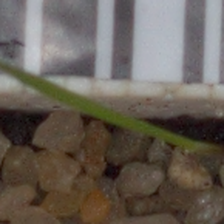

In [ ]:
df_encoded["imagen"][0]

### 4 Guardar dataset en archivo binario

In [ ]:
df_encoded.to_hdf(BASE_FOLDER+"my_dataset/ohe_data_train_resize_224.h5", key='data', mode='w')

In [ ]:
df_binario= pd.read_hdf(BASE_FOLDER+"my_dataset/ohe_data_train_resize_224.h5", key='data')
df_binario

,imagen,etiqueta_Black-grass,etiqueta_Charlock,etiqueta_Cleavers,etiqueta_Common Chickweed,etiqueta_Common wheat,etiqueta_Fat Hen,etiqueta_Loose Silky-bent,etiqueta_Maize,etiqueta_Scentless Mayweed,etiqueta_Shepherds Purse,etiqueta_Small-flowered Cranesbill,etiqueta_Sugar beet
0,"[[[96, 78, 60], [96, 78, 60], [97, 79, 59], [9...",True,False,False,False,False,False,False,False,False,False,False,False
1,"[[[103, 88, 67], [103, 88, 67], [103, 88, 67],...",True,False,False,False,False,False,False,False,False,False,False,False
2,"[[[79, 63, 51], [79, 62, 51], [86, 69, 60], [9...",True,False,False,False,False,False,False,False,False,False,False,False
3,"[[[66, 47, 35], [66, 46, 34], [67, 47, 35], [6...",True,False,False,False,False,False,False,False,False,False,False,False
4,"[[[109, 107, 112], [109, 108, 112], [112, 112,...",True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4745,"[[[66, 55, 46], [66, 50, 42], [69, 52, 43], [6...",False,False,False,False,False,False,False,False,False,False,True,False
4746,"[[[71, 48, 29], [74, 53, 33], [76, 54, 39], [7...",False,False,False,False,False,False,False,False,False,False,True,False
4747,"[[[133, 118, 100], [135, 121, 102], [122, 105,...",False,False,False,False,False,False,False,False,False,False,True,False
4748,"[[[91, 73, 55], [90, 73, 55], [88, 71, 54], [8...",False,False,False,False,False,False,False,False,False,False,True,False
